# Welcome to Trade-a-gator
### A Signal-aggregated Trading Algo
In this Notebook we: -
- pull in market data (pricing for a specific instrument)
- using a number of indicators based on that data
- train 2 models:
  - one based on signals alone
  - one based on pricing and signals
- and using that model, create our own indicator
- we then use that indicator to show how it would have done
Questions to ask
- can our trade-a-gator be used against any pricing data or instruments for only a specific segment

---

### Import Libraries and Dependencies

In [1]:
# Ticker
ticker = 'BTC-USD'
#ticker = 'TSLA'
#ticker = 'AAPL'
live = False
colab = False
vertex = False

# Installs
if colab:
    !pip install pandas_datareader
    !pip install hvplot
    !pip install facets-overview

# Import libraries and dependencies
import pandas as pd
import numpy as np
from pathlib import Path
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

import pandas_datareader as data

import hvplot
import hvplot.pandas
from IPython.display import Markdown

import holoviews as hv
#import pandas as ta-lib


### Pandas dataFrame creation
- Read in CSVs, load in data and build up dataframes

In [2]:
# Read and create DFs
# If true, set for Colab, else Jupyter
if colab:
    # Google Colab version
    csv_path_rd = Path(ticker+'_2014-2021.csv')
    csv_path_sv = Path(ticker+'_2014-2021_train.csv')
    csv_path_pred = Path(ticker+'_vertex_preds.csv')
    base_df = pd.read_csv(csv_path_rd)
else:
    # Jupyter Labs version
    csv_path_rd = Path('./Resources/'+ticker+'_2014-2021.csv')
    csv_path_sv = Path('./Resources/'+ticker+'_2014-2021_train.csv')
    csv_path_pred = Path('./vertex_results/'+ticker+'_vertex_preds.csv')

# If live is true, then pull, save and create DF
# Else read and create DF
if live:
    price_df = data.DataReader(ticker, start='2014', end='2022', data_source='yahoo')
    price_df.to_csv(csv_path_rd)
    base_df = price_df
else:
    base_df = pd.read_csv(csv_path_rd)
    # Set index
    base_df.set_index(pd.to_datetime(base_df['Date'], infer_datetime_format=True), inplace=True)
    base_df.drop(columns=['Date'], inplace=True)

base_df.head()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2014-09-16,468.174011,452.421997,465.864014,457.334015,21056800.0,457.334015
2014-09-17,456.859985,413.104004,456.859985,424.440002,34483200.0,424.440002
2014-09-18,427.834991,384.532013,424.102997,394.795990,37919700.0,394.795990
2014-09-19,423.295990,389.882996,394.673004,408.903992,36863600.0,408.903992
2014-09-20,412.425995,393.181000,408.084991,398.821014,26580100.0,398.821014


### Remove duplicates and N/As, calculate returns

In [3]:
# Drop NAs and calculate mean reversion (10 period)
#base_df['Recent Runup'] = base_df['Close'].dropna().pct_change(10)#.shift(1)

# Drop NAs and calculate daily percent return
base_df['daily_return'] = base_df['Close'].dropna().pct_change()

# Construct dependent variable
# THIS IS WHAT WE ARE PREDICTING
base_df['positive_return'] = np.where(base_df['daily_return'] > 0, 1.0, 0.0)

# Calculate VWAP (Volume-Weighted Average Price)
# VWAP = Cumulative Sum of VWAP divided by Cumulative Sum of Volume
base_df['VWAP'] = (# VWAP - Cumulative Sum
                   (((base_df['High'] + base_df['Low'] + base_df['Close'])/3)*base_df['Volume']).cumsum()
                   # Volume Cumulative Sum
                   )/base_df['Volume'].cumsum()

# Average True Range
# Did not have time to code this one
# Can be gotten by using talib: ta.ATR(base_df['Close'] ...)
#base_df['ATR'] = 

# Check it out
base_df.head()

,High,Low,Open,Close,Volume,Adj Close,daily_return,positive_return,VWAP
Date,,,,,,,,,
2014-09-16,468.174011,452.421997,465.864014,457.334015,21056800.0,457.334015,NaN,0.0,459.310008
2014-09-17,456.859985,413.104004,456.859985,424.440002,34483200.0,424.440002,-0.071926,0.0,442.023698
2014-09-18,427.834991,384.532013,424.102997,394.795990,37919700.0,394.795990,-0.069843,0.0,425.942045
2014-09-19,423.295990,389.882996,394.673004,408.903992,36863600.0,408.903992,0.035735,1.0,420.686158
2014-09-20,412.425995,393.181000,408.084991,398.821014,26580100.0,398.821014,-0.024659,0.0,417.431877


## Calculate and add indicators
### Starting with the EMA ranges
We've added these because they're pretty :)  
They're also useful for evaluating what signals might work, i.e. getting a feel for the data

In [4]:
# Set EMA ranges
ema_window_1 = 1
ema_window_2 = 2
ema_window_3 = 3
ema_window_4 = 4
ema_window_5 = 5
ema_window_6 = 6
ema_window_7 = 7
ema_window_8 = 8
ema_window_10 = 10
ema_window_15 = 15
ema_window_20 = 20
ema_window_50 = 50
ema_window_200 = 200

# Construct Exponential Moving Average ranges
base_df['ema_window_1'] = base_df['Close'].ewm(halflife=ema_window_1).mean()
base_df['ema_window_2'] = base_df['Close'].ewm(halflife=ema_window_2).mean()
base_df['ema_window_3'] = base_df['Close'].ewm(halflife=ema_window_3).mean()
base_df['ema_window_4'] = base_df['Close'].ewm(halflife=ema_window_4).mean()
base_df['ema_window_5'] = base_df['Close'].ewm(halflife=ema_window_5).mean()
base_df['ema_window_6'] = base_df['Close'].ewm(halflife=ema_window_6).mean()
base_df['ema_window_7'] = base_df['Close'].ewm(halflife=ema_window_7).mean()
base_df['ema_window_8'] = base_df['Close'].ewm(halflife=ema_window_8).mean()
base_df['ema_window_10'] = base_df['Close'].ewm(halflife=ema_window_10).mean()
base_df['ema_window_15'] = base_df['Close'].ewm(halflife=ema_window_15).mean()
base_df['ema_window_20'] = base_df['Close'].ewm(halflife=ema_window_20).mean()
base_df['ema_window_50'] = base_df['Close'].ewm(halflife=ema_window_50).mean()
base_df['ema_window_200'] = base_df['Close'].ewm(halflife=ema_window_200).mean()

<AxesSubplot:xlabel='Date'>

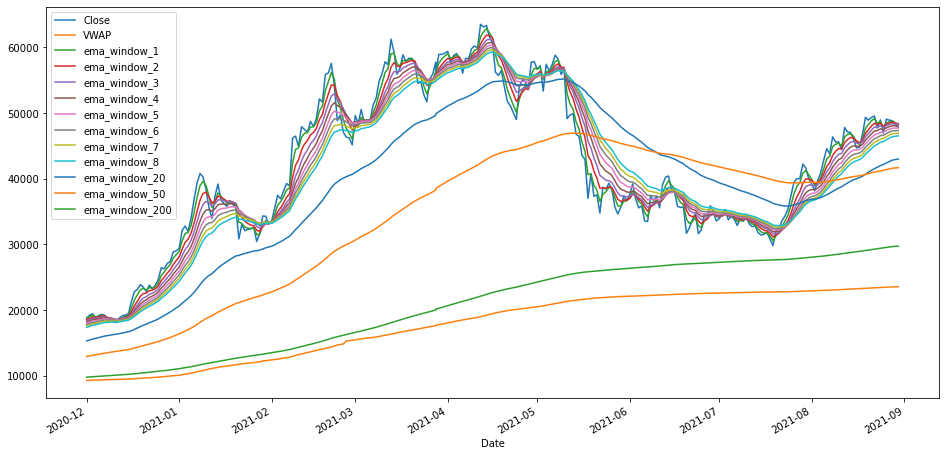

In [5]:
# Plot the EMA ranges
# American Date Format
base_df['12-01-20':][['Close','VWAP',
                      'ema_window_1', 'ema_window_2', 'ema_window_3',  'ema_window_4',
                      'ema_window_5', 'ema_window_6', 'ema_window_7', 'ema_window_8',
                      'ema_window_20', 'ema_window_50', 'ema_window_200'
                     ]].plot(figsize=(16,8))

<AxesSubplot:xlabel='Date'>

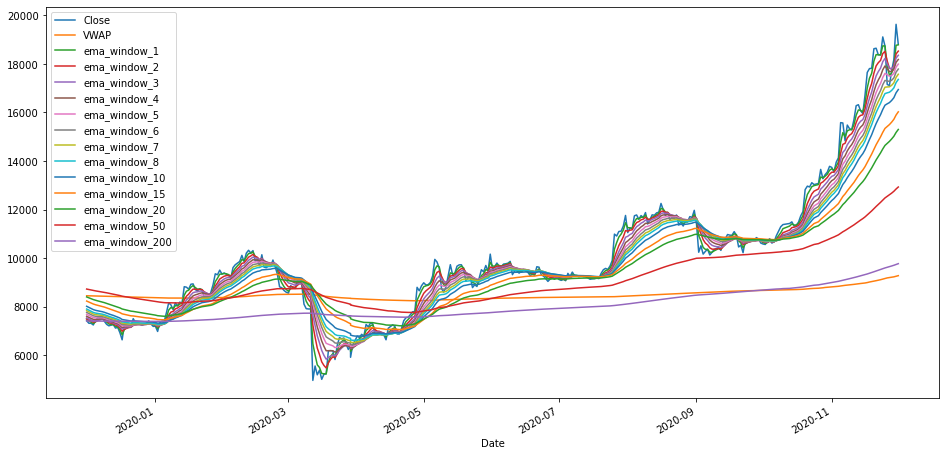

In [6]:
base_df['12-01-19':'12-01-20'][['Close','VWAP',
                                'ema_window_1', 'ema_window_2', 'ema_window_3',  'ema_window_4',
                                'ema_window_5', 'ema_window_6', 'ema_window_7', 'ema_window_8',
                                'ema_window_10', 'ema_window_15', 'ema_window_20', 'ema_window_50','ema_window_200'
                               ]].plot(figsize=(16,8))
# Possibles ... ichi moku (20, 60, 120, 30) ... stochastic () ... rsi () ... hash-rate (BTC)

### Calculate signals
Here we calculate the signals, based on what has been evaluated.

In [7]:
# Initialise the Signal Column
base_df['EMA Signal 8.20'] = 0.0
base_df['EMA Signal 50.200'] = 0.0
base_df['VWAP Signal'] = 0.0

# Generate the trading signals 0 or 1,
# 0: EMA-8 is below the EMA-20
# 1: EMA-8 is above the EMA-20
base_df['EMA Signal 8.20'] = np.where(
    base_df['ema_window_8'] > base_df['ema_window_20'], 1.0, 0.0
)
# 0: EMA-50 is below the EMA-200
# 1: EMA-50 is above the EMA-200
# ... trying something new, close above the 50 = 1
base_df['EMA Signal 50.200'] = np.where(
    #base_df['ema_window_50'] > base_df['ema_window_200'], 1.0, 0.0
    base_df['Close'] > base_df['ema_window_50'], 1.0, 0.0
)
# 0: EMA-3 is below the VWAP
# 1: EMA-3 is above the VWAP
base_df['VWAP Signal'] = np.where(
    base_df['ema_window_3'] > base_df['VWAP'], 1.0, 0.0
)
# This is Mean Regression ... doesn't work for Crypto very well
#base_df['RR Signal'] = np.where(
#    base_df['Recent Runup'] < 0, 1.0, 0.0
#)

# Generate the Entry/Exit for later evaluation
base_df['EMA Entry/Exit 8.20'] = base_df['EMA Signal 8.20'].diff()
base_df['EMA Entry/Exit 50.200'] = base_df['EMA Signal 50.200'].diff()
#base_df['RR Entry/Exit'] = base_df['RR Signal'].diff()
base_df['VWAP Entry/Exit'] = base_df['VWAP Signal'].diff()

# Lag the signals
variables_to_lag = ['EMA Entry/Exit 8.20','EMA Entry/Exit 50.200','VWAP Entry/Exit',]
base_df[variables_to_lag] = base_df[variables_to_lag].shift()

## Plot pricing, indicators and signals
Here we plot the close, some of the indicators and signals to show how the indicators differ in their effectiveness or lack thereof.

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
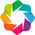

:Overlay
   .Curve.I           :Curve   [Date]   (Close)
   .NdOverlay.I       :NdOverlay   [Variable]
      :Curve   [Date]   (value)
   .Scatter.Close.I   :Scatter   [Date]   (Close)
   .Scatter.Close.II  :Scatter   [Date]   (Close)
   .NdOverlay.II      :NdOverlay   [Variable]
      :Curve   [Date]   (value)
   .Scatter.Close.III :Scatter   [Date]   (Close)
   .Scatter.Close.IV  :Scatter   [Date]   (Close)
   .Curve.II          :Curve   [Date]   (VWAP)
   .Scatter.Close.V   :Scatter   [Date]   (Close)
   .Scatter.Close.VI  :Scatter   [Date]   (Close)

In [8]:
hv.extension('bokeh')

# Visualize EXIT position relative to close price
ema_exit_1 = base_df[base_df['EMA Entry/Exit 8.20'] == -1.0]['Close'].hvplot.scatter(
    color='red', marker='v', size=100, legend=False, ylabel='Price in $', width=1000, height=400
)
ema_exit_2 = base_df[base_df['EMA Entry/Exit 50.200'] == -1.0]['Close'].hvplot.scatter(
    color='orange', marker='v', size=100, legend=False, ylabel='Price in $', width=1000, height=400
)
vwap_exit = base_df[base_df['VWAP Entry/Exit'] == -1.0]['Close'].hvplot.scatter(
    color='black', marker='v', legend=False, ylabel='Price in $', width=1000, height=400
)
# This is Mean Regression ... doesn't really work for Crypto
#rr_exit = base_df[base_df['RR Entry/Exit'] == -1.0]['Close'].hvplot.scatter(
#    color='blue', marker='v', legend=False, ylabel='Price in $', width=1000, height=400
#)

# Visualize ENTRY position relative to close price
ema_entry_1 = base_df[base_df['EMA Entry/Exit 8.20'] == 1.0]['Close'].hvplot.scatter(
    color='green', marker='^', size=100, legend=False, ylabel='Price in $', width=1000, height=400
)
ema_entry_2 = base_df[base_df['EMA Entry/Exit 50.200'] == 1.0]['Close'].hvplot.scatter(
    color='blue', marker='^', size=100, legend=False, ylabel='Price in $', width=1000, height=400
)
vwap_entry = base_df[base_df['VWAP Entry/Exit'] == 1.0]['Close'].hvplot.scatter(
    color='black', marker='^', legend=False, ylabel='Price in $', width=1000, height=400
)
# This is Mean Regression ... doesn't work for Crypto
#rr_entry = base_df[base_df['RR Entry/Exit'] == 1.0]['Close'].hvplot.scatter(
#    color='blue', marker='^', legend=False, ylabel='Price in $', width=1000, height=400
#)


# Visualize close price for the investment
instrument_close = base_df[['Close']].hvplot(
    line_color='lightgray', ylabel='Price in $', width=1000, height=400
)

# Visualize moving averages
moving_avgs = base_df[['ema_window_1', 'ema_window_2', 'ema_window_3', 'ema_window_4','ema_window_5', 'ema_window_6',
                       'ema_window_7', 'ema_window_8', 'ema_window_10', 'ema_window_15', 'ema_window_50', 'ema_window_200'
                      ]].hvplot(ylabel='Price in $', width=1000,height=400
)
moving_avg_10_20 = base_df[['ema_window_8', 'ema_window_20']].hvplot(
    ylabel='Price in $', width=1000, height=400
)
moving_avg_50_200 = base_df[['ema_window_50', 'ema_window_200']].hvplot(
    ylabel='Price in $', width=1000, height=400
)

# Visualize VWAP
vwap = base_df[['VWAP']].hvplot(
    ylabel='Price in $', width=1000, height=400
)

# Overlay plots
entry_exit_plot = (instrument_close *
                   moving_avg_10_20  * ema_entry_1 * ema_exit_1 *
                   moving_avg_50_200 * ema_entry_2 * ema_exit_2 *
                   vwap * vwap_entry * vwap_exit
                  )
entry_exit_plot.opts(yformatter="%.0f")

## Start the Data prep for Model training
Here we start investigating what features we could use for training a model

In [9]:
# Set x variable list of features
x_var_list = ['EMA Signal 8.20','EMA Signal 50.200', 'VWAP Signal']

# Filter by x-variable list
base_df[x_var_list].sample(3)

,EMA Signal 8.20,EMA Signal 50.200,VWAP Signal
Date,,,
2019-08-28,1.0,1.0,1.0
2019-09-07,1.0,1.0,1.0
2016-01-01,1.0,1.0,1.0


### More prep: removing NAs and neg vals

In [10]:
# Drop NAs and replace positive/negative infinity values
base_df.dropna(subset=x_var_list, inplace=True)
base_df.dropna(subset=['daily_return'], inplace=True)
base_df = base_df.replace([np.inf, -np.inf], np.nan)
base_df.head(3)

,High,Low,Open,Close,Volume,Adj Close,daily_return,positive_return,VWAP,ema_window_1,...,ema_window_15,ema_window_20,ema_window_50,ema_window_200,EMA Signal 8.20,EMA Signal 50.200,VWAP Signal,EMA Entry/Exit 8.20,EMA Entry/Exit 50.200,VWAP Entry/Exit
Date,,,,,,,,,,,,,,,,,,,,,
2014-09-17,456.859985,413.104004,456.859985,424.440002,34483200.0,424.440002,-0.071926,0.0,442.023698,435.404673,...,440.507070,440.602032,440.773009,440.858508,0.0,0.0,0.0,NaN,NaN,NaN
2014-09-18,427.834991,384.532013,424.102997,394.795990,37919700.0,394.795990,-0.069843,0.0,425.942045,412.199711,...,424.560774,424.801230,425.234393,425.451091,0.0,0.0,0.0,0.0,0.0,0.0
2014-09-19,423.295990,389.882996,394.673004,408.903992,36863600.0,408.903992,0.035735,1.0,420.686158,410.441994,...,420.371236,420.617988,421.066509,421.292786,0.0,0.0,0.0,0.0,0.0,0.0


### More prep: generate data for Vertex

In [12]:
# Create new dataframe and rename columns for further analysis by Google Vertex AI if applicable
if vertex:
    new_cols = {'VWAP Entry/Exit':'vwap_entry_exit','Adj Close':'adj_close','VWAP Signal':'vwap_signal',
                'EMA Entry/Exit 8.20':'ema_entry_exit_8_20','EMA Entry/Exit 50.200':'ema_entry_exit_50_200',
                'EMA Signal 8.20':'ema_signal_8_20','EMA Signal 50.200':'ema_signal_50_200','Date':'date',
                'High':'high','Low':'low','Open':'open','Close':'close','VWAP':'vwap','Volume':'volume'}
    vertex_ai_df = base_df.reset_index()
    vertex_ai_df.rename(columns=new_cols, inplace=True)
    vertex_ai_df = vertex_ai_df[1:-1]
    
    # Write this vertex train set to CSV
    vertex_ai_df.to_csv(csv_path_sv,index_label='rownum')
    vertex_ai_df.head()
    
    # Create DF for forecasting with Vertex
    #pred_ai_df = pd.date_range(list(vertex_ai_df['date'])[-1], periods=90, freq='1d'
    #                              ).to_frame().reset_index().drop(columns=0).rename(columns={"index":"date"})
    pred_split = round(((base_df.count()[0:1])[0])*0.98)
    pred_ai_df = vertex_ai_df[pred_split:-1]
    pred_ai_df.drop(columns="positive_return", inplace=True)
    pred_ai_df["positive_return"] = ""

    if colab:
        pred_ai_df.to_csv(ticker+'_pred.csv',index_label='rownum')
    else:
        pred_ai_df.to_csv('../Resources/'+ticker+'_pred.csv',index_label='rownum')

    pred_ai_df.tail(3)

### Create Train/Test Split for our ML Model

In [13]:
# For Visualisation, create full Dataframe Sets for Train and Test
# Determine the split
tt_pct = 0.75
tt_tot = (base_df.count()[0:1])[0]
tt_split = round(tt_tot*tt_pct)

# Create DFs
base_train = base_df[0:tt_split]
base_test = base_df[tt_split:-1]

## Visualize Train and Test and ensure suitable
### Facets Dive the Training set!

In [14]:
# Install the facets_overview pip package.
#!pip install facets-overview

# Display the Dive visualization for the training data.
from IPython.core.display import display, HTML

jsonstr = base_train.to_json(orient='records')
HTML_TEMPLATE = """
        <script src="https://cdnjs.cloudflare.com/ajax/libs/webcomponentsjs/1.3.3/webcomponents-lite.js"></script>
        <link rel="import" href="https://raw.githubusercontent.com/PAIR-code/facets/1.0.0/facets-dist/facets-jupyter.html">
        <facets-dive id="elem" height="600"></facets-dive>
        <script>
          var data = {jsonstr};
          document.querySelector("#elem").data = data;
        </script>"""
html = HTML_TEMPLATE.format(jsonstr=jsonstr)
display(HTML(html))

### Facets Overview on both Training and Test sets!

In [15]:
# Create the feature stats for the datasets and stringify it.
import base64
from facets_overview.generic_feature_statistics_generator import GenericFeatureStatisticsGenerator

gfsg = GenericFeatureStatisticsGenerator()
proto = gfsg.ProtoFromDataFrames([{'name': 'train', 'table': base_train},
                                  {'name': 'test', 'table': base_test}])
protostr = base64.b64encode(proto.SerializeToString()).decode("utf-8")

# Display the facets overview visualization for this data
from IPython.core.display import display, HTML

HTML_TEMPLATE = """
        <script src="https://cdnjs.cloudflare.com/ajax/libs/webcomponentsjs/1.3.3/webcomponents-lite.js"></script>
        <link rel="import" href="https://raw.githubusercontent.com/PAIR-code/facets/1.0.0/facets-dist/facets-jupyter.html" >
        <facets-overview id="elem"></facets-overview>
        <script>
          document.querySelector("#elem").protoInput = "{protostr}";
        </script>"""
html2 = HTML_TEMPLATE.format(protostr=protostr)
display(HTML(html2))

## What are we aiming at?!
### Positive Return

In [16]:
# Created earlier ... just viewing now
base_df[['positive_return','daily_return']].sample(7)

,positive_return,daily_return
Date,,
2016-02-05,0.0,-0.007816
2020-05-21,1.0,0.011101
2020-09-22,0.0,-0.029662
2018-06-17,1.0,0.036243
2019-10-17,0.0,-0.016128
2019-01-17,1.0,0.006445
2018-06-16,0.0,-0.007769


### Create Train Split
Create the split and visualise train ... then test features

In [17]:
# Using previous Split ...
# Construct the x train and y train datasets
X_train = base_df[x_var_list][0:tt_split]
y_train = base_df['positive_return'][0:tt_split]

# Construct the x test and y test datasets
X_test = base_df[x_var_list][tt_split:-1]
y_test = base_df['positive_return'][tt_split:-1]

X_train.tail(3)
#y_train.head()

,EMA Signal 8.20,EMA Signal 50.200,VWAP Signal
Date,,,
2019-11-29,0.0,0.0,0.0
2019-11-30,0.0,0.0,0.0
2019-12-01,0.0,0.0,0.0


In [18]:
X_test.tail()
#y_test.head()

,EMA Signal 8.20,EMA Signal 50.200,VWAP Signal
Date,,,
2021-08-24,1.0,1.0,1.0
2021-08-25,1.0,1.0,1.0
2021-08-26,1.0,1.0,1.0
2021-08-27,1.0,1.0,1.0
2021-08-28,1.0,1.0,1.0


### Train Random Forest!
Random Forest do very well in most such tasks and are an Ensemble model

In [26]:
# Import SKLearn Ensemble Model
from sklearn.ensemble import RandomForestClassifier

# Fit a SKLearn linear regression using just the training set (X_train, Y_train):
model = RandomForestClassifier(n_estimators=5000, max_depth=5, random_state=10)
#model = RandomForestClassifier(n_estimators=500000, max_depth=10, random_state=10)
model.fit(X_train, y_train)

# Make a prediction of "y" values from the x test dataset
predictions = model.predict(X_test)

### Assemble predictions for evaluation
We used Google's Vertex AI ... sorry AWS :(

In [27]:
# Assemble ACTUAL y data (Y_test) with RF predicted y data
# (from just above) into two columns in a dataframe:
results = y_test.to_frame()
results["ml_prediction"] = predictions
results["return"] = base_df["daily_return"][tt_split:-1]

if ticker == 'BTC-USD':
    # If BTC/USD then add the results from VERTEX AI (Google's AutoML)
    # Read in the csv, drop all except predicted value
    vertex = True
    vtx_pred_df = pd.read_csv(csv_path_pred)
    vtx_pred_df.set_index(pd.to_datetime(vtx_pred_df['date'], infer_datetime_format=True), inplace=True)
    vtx_pred_df.sort_index(inplace=True)
    # Drop all and leave prediction
    vtx_pred_df = vtx_pred_df["predicted_positive_return"].to_frame()

    # Add VERTEX predicted value to results DF
    all_results = results[((results.count()[0:1])[0])-((vtx_pred_df.count()[0:1])[0])-1:-1]
    all_results["vertex_actual_prediction"] = vtx_pred_df["predicted_positive_return"]
    # Predicted results need to be transformed to 1 or 0
    all_results["vertex_prediction"] = np.where(all_results["vertex_actual_prediction"] > 0.5, 1.0, 0.0)
    results = all_results

# Have a squiz
results.head(10)

,positive_return,ml_prediction,return,vertex_actual_prediction,vertex_prediction
Date,,,,,
2021-07-11,0.0,0.0,-0.031669,0.050801,0.0
2021-07-12,0.0,0.0,-0.013688,0.051312,0.0
2021-07-13,1.0,0.0,0.003679,0.950894,1.0
2021-07-14,0.0,0.0,-0.031735,0.051115,0.0
2021-07-15,0.0,0.0,-0.011302,0.051697,0.0
2021-07-16,1.0,0.0,0.003549,0.951394,1.0
2021-07-17,1.0,0.0,0.008364,0.951263,1.0
2021-07-18,0.0,0.0,-0.030789,0.051045,0.0
2021-07-19,0.0,0.0,-0.032789,0.051241,0.0


## Quickly Vizualize Results
### These results are VERY important and show the differences between ours and other models given more time to analyze

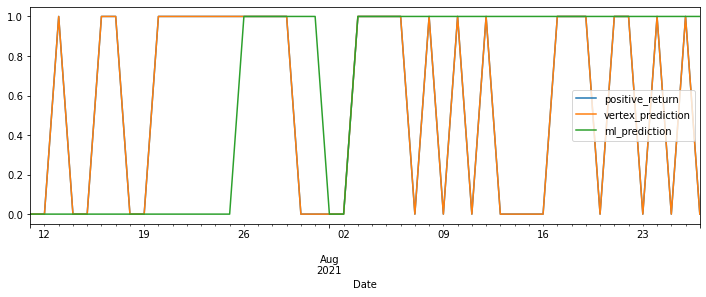

In [28]:
if vertex:
    results[['positive_return', 'vertex_prediction', 'ml_prediction']].plot(figsize=(12,4))
else:
    results[['positive_return', 'ml_prediction']].plot(figsize=(12,4))

## Use Facet again to visualize results
Results of the predictions easily scrutinized

In [29]:
# Visualise the results with Facet
gfsg = GenericFeatureStatisticsGenerator()
proto = gfsg.ProtoFromDataFrames([{'name': 'results', 'table': results}])
protostr = base64.b64encode(proto.SerializeToString()).decode("utf-8")

HTML_TEMPLATE = """
        <script src="https://cdnjs.cloudflare.com/ajax/libs/webcomponentsjs/1.3.3/webcomponents-lite.js"></script>
        <link rel="import" href="https://raw.githubusercontent.com/PAIR-code/facets/1.0.0/facets-dist/facets-jupyter.html" >
        <facets-overview id="elem"></facets-overview>
        <script>
          document.querySelector("#elem").protoInput = "{protostr}";
        </script>"""
html3 = HTML_TEMPLATE.format(protostr=protostr)
display(HTML(html3))

## Calculate Cumulative Returns
### Based on target: positive return
This is important to show **as it demonstrates a viable strategy**, assuming an accurate model for predicting a positive return

In [30]:
# Calculate cumulative return of model and plot the result
# Don't use Matplotlib
matplotlib = False
if matplotlib:
    (1 + (results['return'] * results['ml_prediction']
         )).cumprod().plot(title="Cumulative Returns for " + ticker +
                                 " Using Positive Return Prediction (Long Positions)\n",figsize=(14,7))

# Calculate vals for HvPlot; if BTC, load Google Vertex results
# Actual
results['actual_cum_ret'] = (1 + (results['return'] * results['positive_return'])).cumprod()

# This ML return
results['ml_pred_cum_ret'] = (1 + (results['return'] * results['ml_prediction'])).cumprod()

if vertex:
    # Vertex return
    results['vtx_pred_cum_ret'] = (1 + (results['return'] * results['vertex_prediction'])).cumprod()

results.head(2)

,positive_return,ml_prediction,return,vertex_actual_prediction,vertex_prediction,actual_cum_ret,ml_pred_cum_ret,vtx_pred_cum_ret
Date,,,,,,,,
2021-07-11,0.0,0.0,-0.031669,0.050801,0.0,1.0,1.0,1.0
2021-07-12,0.0,0.0,-0.013688,0.051312,0.0,1.0,1.0,1.0


### Visualise cumulative returns

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
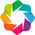

:Overlay
   .NdOverlay.I  :NdOverlay   [Variable]
      :Curve   [Date]   (value)
   .NdOverlay.II :NdOverlay   [Variable]
      :Curve   [Date]   (value)

In [31]:
hv.extension('bokeh')

# Plot results based on predictions
# Set up plots for Random Forests first
prediction = results[['ml_pred_cum_ret','actual_cum_ret']].hvplot(
    title="Cumulative Returns for " + ticker + " Using Positive Return Predictions\n",
    ylabel='Nx Return', width=800, height=400)
plot_predictions = (prediction)

if vertex:
    # If Vertex data exists, add to plot
    prediction_vtx = results[['ml_pred_cum_ret','vtx_pred_cum_ret','actual_cum_ret']].hvplot(
        ylabel='Nx Return',
        width=800, height=400)
    plot_predictions = (prediction * prediction_vtx)

plot_predictions

---
## Portfolio Tracking ...
### Assuming a traditional strategy (without ML augmentaton)
Here we build up a backtested portfolio based on the chosen instrument

In [38]:
# Signal tracked
# Depending on signal ...
#signal = "EMA Signal 8.20"
entry_exit = "EMA Entry/Exit 8.20"
signal = "EMA Signal 50.200"
#entry_exit = "EMA Entry/Exit 50.200"
#signal = "VWAP Signal"
#entry_exit = "VWAP Entry/Exit"

# Set initial capital
initial_capital = float(100000)

# Set the share size
share_size = 200

# Take a 500 share position where the VWAP is 1
base_df['Position'] = share_size * base_df[signal]

# Find the points in time where a 500 share position is bought or sold
base_df['Entry/Exit Position'] = base_df['Position'].diff()

# Multiply share price by entry/exit positions and get the cumulative sum
base_df['Portfolio Holdings'] = base_df['Close'] * base_df['Entry/Exit Position'].cumsum()

# Subtract the initial capital by the portfolio holdings to get the amount of liquid cash in the portfolio
base_df['Portfolio Cash'] = initial_capital - (base_df['Close'] * base_df['Entry/Exit Position']).cumsum()

# Get the total portfolio value by adding the cash amount by the portfolio holdings (or investments)
base_df['Portfolio Total'] = base_df['Portfolio Cash'] + base_df['Portfolio Holdings']

# Calculate the portfolio daily returns
base_df['Portfolio Daily Returns'] = base_df['Portfolio Total'].pct_change()

# Calculate the cumulative returns
base_df['Portfolio Cumulative Returns'] = (1 + base_df['Portfolio Daily Returns']).cumprod() - 1

# Print the DataFrame
base_df.tail(3)

,High,Low,Open,Close,Volume,Adj Close,daily_return,positive_return,VWAP,ema_window_1,...,EMA Entry/Exit 8.20,EMA Entry/Exit 50.200,VWAP Entry/Exit,Position,Entry/Exit Position,Portfolio Holdings,Portfolio Cash,Portfolio Total,Portfolio Daily Returns,Portfolio Cumulative Returns
Date,,,,,,,,,,,,,,,,,,,,,
2021-08-27,49283.503906,48499.238281,49072.585938,48902.402344,2.856810e+10,48902.402344,-0.003185,0.0,23499.020624,48671.147091,...,0.0,0.0,0.0,200.0,0.0,9.780480e+06,1.624840e+06,1.140532e+07,-0.002733,113.053208
2021-08-28,49644.113281,47925.855469,48911.250000,48829.832031,2.588965e+10,48829.832031,-0.001484,0.0,23518.465206,48750.489561,...,0.0,0.0,0.0,200.0,0.0,9.765966e+06,1.624840e+06,1.139081e+07,-0.001273,112.908067
2021-08-30,48870.296875,47785.402344,48716.660156,47785.402344,2.823981e+10,47785.402344,-0.021389,0.0,23539.093972,48267.945952,...,0.0,0.0,0.0,200.0,0.0,9.557080e+06,1.624840e+06,1.118192e+07,-0.018338,110.819208


## Plot Entry/Exits for Portfolio based on Trades

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
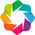

:Overlay
   .Curve.I                    :Curve   [Date]   (Portfolio Total)
   .Scatter.Portfolio_Total.I  :Scatter   [Date]   (Portfolio Total)
   .Scatter.Portfolio_Total.II :Scatter   [Date]   (Portfolio Total)

In [39]:
hv.extension('bokeh')

# Visualize exit position relative to total portfolio value
exit = base_df[base_df[entry_exit] == -1.0]['Portfolio Total'].hvplot.scatter(
    color='red',
    legend=False,
    ylabel='Total Portfolio Value',
    width=1000,
    height=400
)

# Visualize entry position relative to total portfolio value
entry = base_df[base_df[entry_exit] == 1.0]['Portfolio Total'].hvplot.scatter(
    color='green',
    legend=False,
    ylabel='Total Portfolio Value',
    width=1000,
    height=400
)

# Visualize total portoflio value for the investment
total_portfolio_value = base_df[['Portfolio Total']].hvplot(
    line_color='lightgray',
    ylabel='Total Portfolio Value',
    width=1000,
    height=400
)

# Overlay plots
portfolio_entry_exit_plot = total_portfolio_value * entry * exit
portfolio_entry_exit_plot.opts(yformatter="%.0f", xaxis=None)

# That's ALL Folks!
### TO DO
- Amalgamate all signals into Portfolio
- More sofisticated Trade Management, e.g. stop-losses, shorting, etc.
- Better visualisations
- Actual Trade API integration